<a href="https://colab.research.google.com/github/Lucs1590/vgg_bpca/blob/master/notebooks/vgg_net_food101.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# VGG NET (Food-101)
Here we are using a VGG net with 16 layers with the dataset food-101.

We are trying to reproduce the results of the paper [1] and after we will try to change some layers and see how it affects the results.

[1] https://arxiv.org/pdf/1409.1556.pdf


# Imports

In [31]:
%pip install lime
# %pip install tensorflow==2.8.3
# %pip install tensorflow-gpu==2.8.3
import os
import time
import json
import random
import math

from uuid import uuid4
from datetime import datetime

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import pandas as pd
from PIL import Image

from google.colab import drive

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

import tensorflow as tf

import lime
from lime import lime_image
from skimage.segmentation import mark_boundaries

from keras import backend
from keras import layers as filters
from keras.applications import imagenet_utils
from keras.callbacks import (EarlyStopping, ModelCheckpoint, ReduceLROnPlateau,
                             TensorBoard, Callback, LearningRateScheduler, CSVLogger)
import tensorflow_datasets as tfds
from keras.engine import training
from keras.layers import VersionAwareLayers, Layer
# from keras.layers.pooling.base_pooling2d import Pooling2D
from keras.models import Sequential, model_from_json, load_model
from keras.optimizers import Adam, SGD
from keras.preprocessing import image
from keras.utils import data_utils, layer_utils, to_categorical, load_img, img_to_array
from sklearn.model_selection import train_test_split


Note: you may need to restart the kernel to use updated packages.


/Users/brito/opt/anaconda3/envs/mestrado/lib/python3.8/site-packages/requests/__init__.py:102: RequestsDependencyWarning: urllib3 (1.26.9) or chardet (5.1.0)/charset_normalizer (3.1.0) doesn't match a supported version!
  warnings.warn("urllib3 ({}) or chardet ({})/charset_normalizer ({}) doesn't match a supported "
/Users/brito/opt/anaconda3/envs/mestrado/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
print(tf.__version__)

2.11.0


In [3]:
%load_ext tensorboard
drive.mount('/content/gdrive')


In [4]:
!nvidia-smi


zsh:1: command not found: nvidia-smi


In [5]:
tf.config.list_physical_devices('GPU')

[]

# Load the dataset

In [3]:
np.random.seed(77)
tf.random.set_seed(77)


In [4]:
dataset_path = '/Volumes/SSD/datasets/food101/'

In [5]:
(train_data, test_data, valid_data),df_info = tfds.load(
    'food101',
    data_dir='/content/gdrive/MyDrive/Projetos/Food101',
    split=['train','validation[0%:30%]','validation[30%:]'], # in our case we have training and validation but some dataset have testing too
    shuffle_files=True, # we are shuffle our files to some randomness in our data 
    as_supervised=True, # beacuse our dataset is supervised 
    with_info=True
)


In [6]:
def scale_image_data(images,labels):
  '''
  This function will scale image data to 0-1
  '''
  return images/255,labels

In [7]:
def resize_image_data(images,labels,img_size=(224,224)):
  '''
  This function will reduce image size and change dtype int float32
  '''
  image  = tf.image.resize(images,img_size)

  return tf.cast(image,dtype=tf.float32),labels

In [8]:
train_data = train_data.map(scale_image_data).map(resize_image_data, num_parallel_calls=tf.data.AUTOTUNE)
test_data = test_data.map(scale_image_data).map(resize_image_data, num_parallel_calls=tf.data.AUTOTUNE)
valid_data = valid_data.map(scale_image_data).map(resize_image_data, num_parallel_calls=tf.data.AUTOTUNE)

In [9]:
for image,label in train_data.take(1):
    print(f'Image shape: {image.shape}')
    print(f'Image dtype: {image.dtype}')
    print(f'Target class from Food101 (tensor form): {label}')
    print(f'Target class from Food101 (str form): {df_info.features["label"].int2str(label)}')
    print(f'Image values: \n{image.numpy()[:2]}')

Image shape: (224, 224, 3)
Image dtype: <dtype: 'float32'>
Target class from Food101 (tensor form): 1
Target class from Food101 (str form): baby_back_ribs
Image values: 
[[[0.34805924 0.34805924 0.07354942]
  [0.3464386  0.33467388 0.07192877]
  [0.3387355  0.3182873  0.0689876 ]
  ...
  [0.7157463  0.75888354 0.7667267 ]
  [0.7116847  0.75482196 0.7626651 ]
  [0.7113641  0.75450134 0.7623445 ]]

 [[0.3787115  0.3669468  0.09635855]
  [0.36228493 0.35052022 0.08777513]
  [0.36756703 0.34711885 0.09781913]
  ...
  [0.7428574  0.78599465 0.7938378 ]
  [0.74425757 0.7873948  0.79523796]
  [0.72118807 0.77609    0.7800116 ]]]


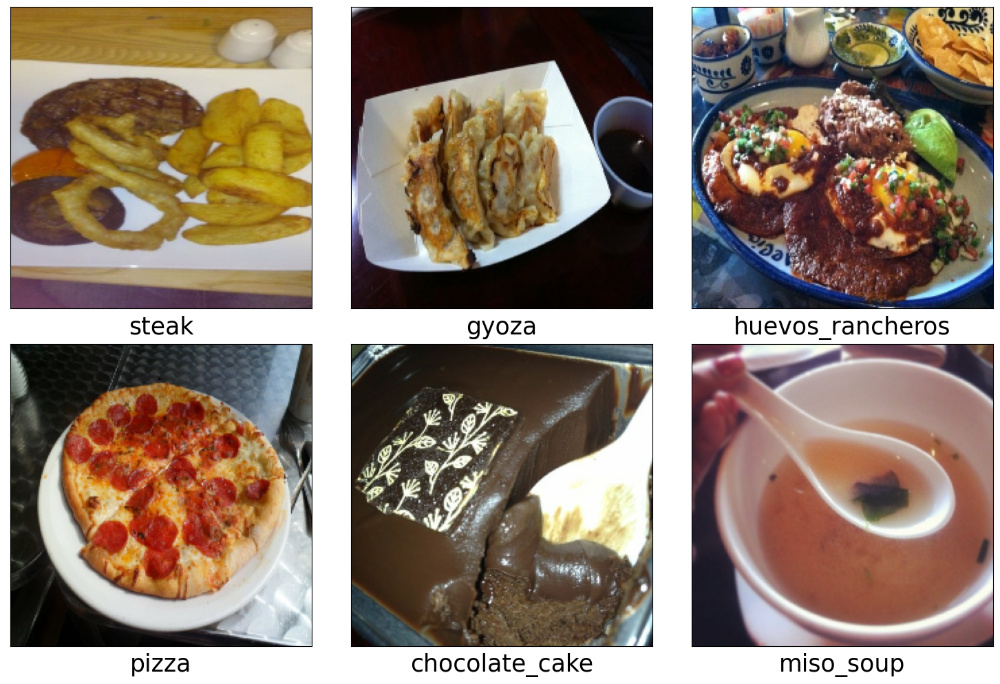

In [10]:
plt.figure(figsize=(15, 10))
random_images = []

num_rows = 2
num_cols = 3
num_images = num_rows * num_cols

for i, (image, label) in enumerate(train_data.take(num_images)):
    plt.subplot(num_rows, num_cols, i + 1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(image.numpy(), cmap="gray")
    plt.xlabel(df_info.features["label"].int2str(label), fontsize=25)

    img_path = f'{uuid4()}.png'
    random_images.append(img_path)

plt.tight_layout()
plt.show()

In [11]:
print(f'Train: {len(train_data)}')
print(f'Test: {len(test_data)}')
print(f'Validation: {len(valid_data)}')


Train: 75750
Test: 7575
Validation: 17675


In [12]:
train_data=train_data.shuffle(buffer_size=1000).batch(batch_size=64).prefetch(tf.data.AUTOTUNE)
test_data=test_data.shuffle(buffer_size=1000).batch(batch_size=64).prefetch(tf.data.AUTOTUNE)
valid_data = valid_data.shuffle(buffer_size=1000).batch(batch_size=64).prefetch(tf.data.AUTOTUNE)


In [13]:
classes_dict = {str(i):[label] for i,label in enumerate(df_info.features['label'].names)}
print(classes_dict)

{'0': ['apple_pie'], '1': ['baby_back_ribs'], '2': ['baklava'], '3': ['beef_carpaccio'], '4': ['beef_tartare'], '5': ['beet_salad'], '6': ['beignets'], '7': ['bibimbap'], '8': ['bread_pudding'], '9': ['breakfast_burrito'], '10': ['bruschetta'], '11': ['caesar_salad'], '12': ['cannoli'], '13': ['caprese_salad'], '14': ['carrot_cake'], '15': ['ceviche'], '16': ['cheesecake'], '17': ['cheese_plate'], '18': ['chicken_curry'], '19': ['chicken_quesadilla'], '20': ['chicken_wings'], '21': ['chocolate_cake'], '22': ['chocolate_mousse'], '23': ['churros'], '24': ['clam_chowder'], '25': ['club_sandwich'], '26': ['crab_cakes'], '27': ['creme_brulee'], '28': ['croque_madame'], '29': ['cup_cakes'], '30': ['deviled_eggs'], '31': ['donuts'], '32': ['dumplings'], '33': ['edamame'], '34': ['eggs_benedict'], '35': ['escargots'], '36': ['falafel'], '37': ['filet_mignon'], '38': ['fish_and_chips'], '39': ['foie_gras'], '40': ['french_fries'], '41': ['french_onion_soup'], '42': ['french_toast'], '43': ['fr

In [14]:
labels = [classes_dict[str(i)][0] for i in range(len(classes_dict))]
# ['apple_pie', 'baby_back_ribs', 'baklava', 'beef_carpaccio', 'beef_tartare', 'beet_salad', 'beignets', 'bibimbap', 'bread_pudding', 'breakfast_burrito', 'bruschetta', 'caesar_salad', 'cannoli', 'caprese_salad',
#  'carrot_cake', 'ceviche', 'cheesecake', 'cheese_plate', 'chicken_curry', 'chicken_quesadilla', 'chicken_wings', 'chocolate_cake', 'chocolate_mousse', 'churros', 'clam_chowder', 'club_sandwich', 'crab_cakes',
#  'creme_brulee', 'croque_madame', 'cup_cakes', 'deviled_eggs', 'donuts', 'dumplings', 'edamame', 'eggs_benedict', 'escargots', 'falafel', 'filet_mignon', 'fish_and_chips', 'foie_gras', 'french_fries',
#  'french_onion_soup', 'french_toast', 'fried_calamari', 'fried_rice', 'frozen_yogurt', 'garlic_bread', 'gnocchi', 'greek_salad', 'grilled_cheese_sandwich', 'grilled_salmon', 'guacamole', 'gyoza', 'hamburger',
#  'hot_and_sour_soup', 'hot_dog', 'huevos_rancheros', 'hummus', 'ice_cream', 'lasagna', 'lobster_bisque', 'lobster_roll_sandwich', 'macaroni_and_cheese', 'macarons', 'miso_soup', 'mussels', 'nachos', 'omelette',
#  'onion_rings', 'oysters', 'pad_thai', 'paella', 'pancakes', 'panna_cotta', 'peking_duck', 'pho', 'pizza', 'pork_chop', 'poutine', 'prime_rib', 'pulled_pork_sandwich', 'ramen', 'ravioli', 'red_velvet_cake',
#  'risotto', 'samosa', 'sashimi', 'scallops', 'seaweed_salad', 'shrimp_and_grits', 'spaghetti_bolognese', 'spaghetti_carbonara', 'spring_rolls', 'steak', 'strawberry_shortcake', 'sushi', 'tacos', 'takoyaki',
#  'tiramisu', 'tuna_tartare', 'waffles']

## Data Augmentation
The last thing in this step is apply a lot of filters to the train dataset.



In [15]:
Data_augumentaion=tf.keras.Sequential([
  filters.RandomFlip('horizontal'),
  filters.RandomRotation(0.45),
  filters.RandomZoom(0.25),
  filters.RandomHeight(0.25),
  filters.RandomWidth(0.25)
], name="data_augumentation")

# Auxiliary Code

## TensorBoard Settings

In [16]:
date_now = datetime.now().strftime("%Y%m%d-%H%M%S")
log_dir = f'/Users/brito/Documents/Dev/vgg_bpca/notebooks/logs/fit/{date_now}'


In [18]:
# from tensorboard import notebook
# notebook.display(port=6006, height=1000)
%tensorboard --logdir={log_dir}


<IPython.core.display.Javascript object>

## Learning Rate Scheduler


In [17]:
class CyclicLR(Callback):

    def __init__(self, base_lr=1e-5, max_lr=1e-3, step_size=500, log_dir=None):
        super(CyclicLR, self).__init__()

        self.base_lr = base_lr
        self.max_lr = max_lr
        self.step_size = step_size
        self.scale_fn = lambda x: 1/(2.**(x-1))
        self.clr_iterations = 0.
        self.trn_iterations = 0.
        self.clr_iterations = 0.
        self.history = {}
        self.log_dir = log_dir
        if self.log_dir:
            # create a summary writer
            self.file_writer = tf.summary.create_file_writer(self.log_dir)

    def clr(self):
        cycle = np.floor(1+self.clr_iterations/(2*self.step_size))
        x = np.abs(self.clr_iterations/self.step_size - 2*cycle + 1)
        lr = self.base_lr + (self.max_lr-self.base_lr) * np.maximum(0, (1-x))*self.scale_fn(cycle)
        # print(f'Current LR: {lr}')
        return lr

    def on_train_begin(self, logs={}):
        logs = logs or {}

        if self.clr_iterations == 0:
            backend.set_value(self.model.optimizer.lr, self.base_lr)
        else:
            backend.set_value(self.model.optimizer.lr, self.clr())

    def on_batch_end(self, epoch, logs=None):
        logs = logs or {}
        self.trn_iterations += 1
        self.clr_iterations += 1

        self.history.setdefault('lr', []).append(
            backend.get_value(self.model.optimizer.lr)
        )
        self.history.setdefault('iterations', []).append(self.trn_iterations)

        for k, v in logs.items():
            self.history.setdefault(k, []).append(v)

        backend.set_value(self.model.optimizer.lr, self.clr())

    def on_epoch_end(self, epoch, logs=None):
        lr = backend.get_value(self.model.optimizer.lr)
        with self.file_writer.as_default():
            tf.summary.scalar('learning rate', lr, step=int(epoch))


clr = CyclicLR(log_dir=log_dir)


In [18]:
def lr_scheduler(epoch, lr, nb_epoch=0):
    drop_rate = .99
    epochs_drop = 8

    if epoch % epochs_drop == 0:
        return lr * math.pow(drop_rate, math.floor(epoch/epochs_drop))

    return lr


## BPCA Pooling Layer

In [19]:

class BPCAPooling(tf.keras.layers.Layer):
    def __init__(self, pool_size=2, stride=2, n_components=1, expected_shape=None, **kwargs):
        super(BPCAPooling, self).__init__(**kwargs)
        self.pool_size = pool_size
        self.stride = stride
        self.n_components = n_components
        self.expected_shape = expected_shape

        self.patch_size = [1, self.pool_size, self.pool_size, 1]
        self.strides = [1, self.stride, self.stride, 1]

    def build(self, input_shape):
        super(BPCAPooling, self).build(input_shape)

    def get_config(self):
        config = {
            'pool_size': (self.pool_size, self.pool_size),
            'strides': (self.stride, self.stride)
        }
        base_config = super(BPCAPooling, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))

    @tf.function
    def bpca_pooling(self,feature_map):
        # Compute the region of interest
        h, w, c = self.expected_shape  # block_height, block_width, block_channels
        d = c // (self.pool_size * self.pool_size)  # block_depth

        # Create blocks (patches)
        data = tf.reshape(feature_map,[1, h, w, c])
        patches = tf.image.extract_patches(
            images=data,
            sizes=self.patch_size,
            strides=self.strides,
            rates=[1, 1, 1, 1],
            padding='VALID'
        )
        patches = tf.reshape(
            patches,
            [h*w*d, self.pool_size * self.pool_size]
        )

        # Normalize the data by subtracting the mean and dividing by the standard deviation
        mean = tf.reduce_mean(patches, axis=0)
        std = tf.math.reduce_std(patches, axis=0)
        patches = (patches - mean) / std
        patches = tf.where(tf.math.is_nan(patches), 0.0, patches)

        # Perform the Singular Value Decomposition (SVD) on the data
        _, _, v = tf.linalg.svd(patches)

        # Extract the first n principal components from the matrix v
        pca_components = v[:, :self.n_components]

        # Perform the PCA transformation on the data
        transformed_patches = tf.matmul(patches, pca_components)
        return tf.reshape(transformed_patches, [h // self.pool_size, w // self.pool_size, c])

    def call(self, inputs):
        pooled = tf.vectorized_map(self.bpca_pooling, inputs)
        return pooled


In [20]:
class GlobalBPCAPooling2D(tf.keras.layers.Layer):
    def __init__(self, n_components=1, expected_output_shape=(-1, 512), **kwargs):
        super(GlobalBPCAPooling2D, self).__init__(**kwargs)
        self.n_components = n_components
        self.expected_output_shape = expected_output_shape

    def build(self, input_shape):
        super(GlobalBPCAPooling2D, self).build(input_shape)

    def get_config(self):
        config = {
            'n_components': self.n_components
        }
        base_config = super(GlobalBPCAPooling2D, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))

    @tf.function
    def bpca_pooling(self, feature_map):
        # Flatten the feature map
        patches = tf.reshape(feature_map, self.expected_output_shape)

        # Normalize the data by subtracting the mean and dividing by the standard deviation
        mean = tf.reduce_mean(patches, axis=0)
        std = tf.math.reduce_std(patches, axis=0)
        patches = (patches - mean) / std
        patches = tf.where(tf.math.is_nan(patches), 0.0, patches)

        # Perform the Singular Value Decomposition (SVD) on the data
        _, _, v = tf.linalg.svd(patches)

        # Extract the first n principal components from the matrix v
        pca_components = v[:, :self.n_components]

        # Perform the PCA transformation on the data
        transformed_patches = tf.matmul(patches, pca_components)
        return transformed_patches

    def call(self, inputs):
        if len(self.expected_output_shape) == 2:
            pooled = tf.reshape(inputs, self.expected_output_shape)
        else:
            pooled = tf.vectorized_map(self.bpca_pooling, inputs)
            pooled = tf.reduce_mean(pooled, axis=0, keepdims=True)
        return pooled


# VGG Archtecture

## VGG 16
- The cons of this architecture are that it is slow to train and produces the model with very large size.
- A total of 13 convolutional layers are stacked one after the other and 3 dense layers for classification.


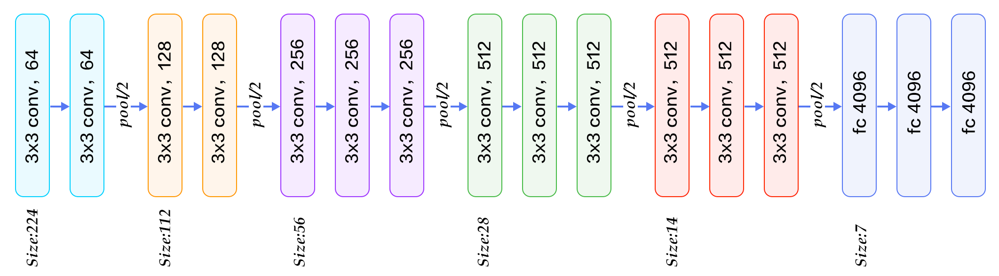

In [23]:
layers = VersionAwareLayers()
WEIGHTS_PATH = (
    "https://storage.googleapis.com/tensorflow/keras-applications/"
    "vgg16/vgg16_weights_tf_dim_ordering_tf_kernels.h5"
)
WEIGHTS_PATH_NO_TOP = (
    "https://storage.googleapis.com/tensorflow/"
    "keras-applications/vgg16/"
    "vgg16_weights_tf_dim_ordering_tf_kernels_notop.h5"
)


def VGG16(include_top=True, weights="imagenet", input_tensor=None, input_shape=None, pooling=None, classes=1000, classifier_activation="softmax"):
    if not (weights in {"imagenet", None} or tf.io.gfile.exists(weights)):
        raise ValueError(
            "The `weights` argument should be either "
            "`None` (random initialization), `imagenet` "
            "(pre-training on ImageNet), "
            "or the path to the weights file to be loaded.  Received: "
            f"weights={weights}"
        )

    if weights == "imagenet" and include_top and classes != 1000:
        raise ValueError(
            'If using `weights` as `"imagenet"` with `include_top` '
            "as true, `classes` should be 1000.  "
            f"Received `classes={classes}`"
        )

    input_shape = imagenet_utils.obtain_input_shape(
        input_shape,
        default_size=224,
        min_size=32,
        data_format=backend.image_data_format(),
        require_flatten=include_top,
        weights=weights,
    )

    if input_tensor is None:
        img_input = layers.Input(shape=input_shape)
    else:
        if not backend.is_keras_tensor(input_tensor):
            img_input = layers.Input(tensor=input_tensor, shape=input_shape)
        else:
            img_input = input_tensor
    # Block 1
    x = layers.Conv2D(64, (3, 3), activation="relu", padding="same", name="block1_conv1")(img_input)
    x = layers.Conv2D(64, (3, 3), activation="relu", padding="same", name="block1_conv2")(x)
    # x = layers.MaxPooling2D((2, 2), strides=(2, 2), name="block1_pool")(x)
    # x = layers.AveragePooling2D((2, 2), strides=(2, 2), name="block1_pool")(x)
    x = BPCAPooling(pool_size=2, stride=2, n_components=1, name="block1_pool", expected_shape=(224, 224, 64))(x)

    # Block 2
    x = layers.Conv2D(128, (3, 3), activation="relu", padding="same", name="block2_conv1")(x)
    x = layers.Conv2D(128, (3, 3), activation="relu", padding="same", name="block2_conv2")(x)
    # x = layers.MaxPooling2D((2, 2), strides=(2, 2), name="block2_pool")(x)
    # x = layers.AveragePooling2D((2, 2), strides=(2, 2), name="block2_pool")(x)
    x = BPCAPooling(pool_size=2, stride=2, n_components=1, name="block2_pool", expected_shape=(112, 112, 128))(x)

    # Block 3
    x = layers.Conv2D(256, (3, 3), activation="relu", padding="same", name="block3_conv1")(x)
    x = layers.Conv2D(256, (3, 3), activation="relu", padding="same", name="block3_conv2")(x)
    x = layers.Conv2D(256, (3, 3), activation="relu", padding="same", name="block3_conv3")(x)
    # x = layers.MaxPooling2D((2, 2), strides=(2, 2), name="block3_pool")(x)
    # x = layers.AveragePooling2D((2, 2), strides=(2, 2), name="block3_pool")(x)
    x = BPCAPooling(pool_size=2, stride=2, n_components=1, name="block3_pool", expected_shape=(56, 56, 256))(x)

    # Block 4
    x = layers.Conv2D(512, (3, 3), activation="relu", padding="same", name="block4_conv1")(x)
    x = layers.Conv2D(512, (3, 3), activation="relu", padding="same", name="block4_conv2")(x)
    x = layers.Conv2D(512, (3, 3), activation="relu", padding="same", name="block4_conv3")(x)
    # x = layers.MaxPooling2D((2, 2), strides=(2, 2), name="block4_pool")(x)
    # x = layers.AveragePooling2D((2, 2), strides=(2, 2), name="block4_pool")(x)
    x = BPCAPooling(pool_size=2, stride=2, n_components=1, name="block4_pool", expected_shape=(28, 28, 512))(x)

    # Block 5
    x = layers.Conv2D(512, (3, 3), activation="relu", padding="same", name="block5_conv1")(x)
    x = layers.Conv2D(512, (3, 3), activation="relu", padding="same", name="block5_conv2")(x)
    x = layers.Conv2D(512, (3, 3), activation="relu", padding="same", name="block5_conv3")(x)
    # x = layers.MaxPooling2D((2, 2), strides=(2, 2), name="block5_pool")(x)
    # x = layers.AveragePooling2D((2, 2), strides=(2, 2), name="block5_pool")(x)
    x = BPCAPooling(pool_size=2, stride=2, n_components=1, name="block5_pool", expected_shape=(14, 14, 512))(x)

    if include_top:
        # Classification block
        x = layers.Flatten(name="flatten")(x)
        x = layers.Dense(4096, activation="relu", name="fc1")(x)
        x = layers.Dense(4096, activation="relu", name="fc2")(x)

        imagenet_utils.validate_activation(classifier_activation, weights)
        x = layers.Dense(
            classes, activation=classifier_activation, name="predictions"
        )(x)
    else:
        if pooling == "avg":
            x = layers.GlobalAveragePooling2D()(x)
        elif pooling == "max":
            x = layers.GlobalMaxPooling2D()(x)
        else:
            x = layers.GlobalMaxPooling2D()(x)
            # x = GlobalBPCAPooling2D(n_components=1, expected_output_shape=(-1, 512))(x) # Could be this method, but the result is the same and GlobalMaxPooling2D is faster

    if input_tensor is not None:
        inputs = layer_utils.get_source_inputs(input_tensor)
    else:
        inputs = img_input

    vgg16_model = training.Model(inputs, x, name="vgg16")

    if weights == "imagenet":
        if include_top:
            weights_path = data_utils.get_file(
                "vgg16_weights_tf_dim_ordering_tf_kernels.h5",
                WEIGHTS_PATH,
                cache_subdir="models",
                file_hash="64373286793e3c8b2b4e3219cbf3544b",
            )
        else:
            weights_path = data_utils.get_file(
                "vgg16_weights_tf_dim_ordering_tf_kernels_notop.h5",
                WEIGHTS_PATH_NO_TOP,
                cache_subdir="models",
                file_hash="6d6bbae143d832006294945121d1f1fc",
            )
        vgg16_model.load_weights(weights_path)
    elif weights is not None:
        vgg16_model.load_weights(weights)

    return vgg16_model


# Training

## Loading model from scratch

In [24]:
# VGG16
vgg16_model = VGG16(
    include_top=False,
    weights='imagenet',
    input_shape=(224, 224, 3),
    classes=len(labels),
    pooling="avg"
)

for idx, layer in enumerate(vgg16_model.layers):
    print(idx, layer)
    layer.trainable = False

vgg16_model.summary()


0 <keras.engine.input_layer.InputLayer object at 0x7f87f69a5520>
1 <keras.layers.convolutional.conv2d.Conv2D object at 0x7f880c61c370>
2 <keras.layers.convolutional.conv2d.Conv2D object at 0x7f880c61c340>
3 <__main__.BPCAPooling object at 0x7f880c61c730>
4 <keras.layers.convolutional.conv2d.Conv2D object at 0x7f880c661490>
5 <keras.layers.convolutional.conv2d.Conv2D object at 0x7f880c661340>
6 <__main__.BPCAPooling object at 0x7f880c61a2b0>
7 <keras.layers.convolutional.conv2d.Conv2D object at 0x7f87f73e92e0>
8 <keras.layers.convolutional.conv2d.Conv2D object at 0x7f87f73cd790>
9 <keras.layers.convolutional.conv2d.Conv2D object at 0x7f87f67e1d60>
10 <__main__.BPCAPooling object at 0x7f87f6e4f610>
11 <keras.layers.convolutional.conv2d.Conv2D object at 0x7f87f6ee3190>
12 <keras.layers.convolutional.conv2d.Conv2D object at 0x7f87f6e58f70>
13 <keras.layers.convolutional.conv2d.Conv2D object at 0x7f87f6ed6880>
14 <__main__.BPCAPooling object at 0x7f87f6ed3340>
15 <keras.layers.convolutional

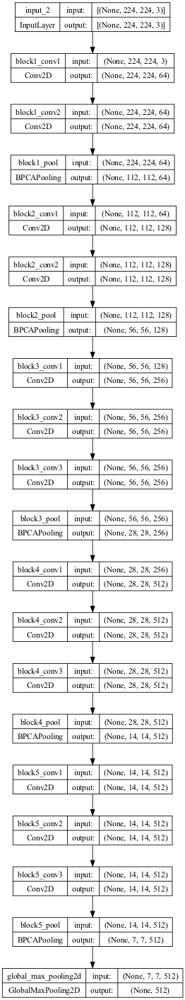

In [25]:
tf.keras.utils.plot_model(vgg16_model, expand_nested=True, dpi=60, show_shapes=True)

Add classification layers.

In [28]:
model = Sequential()
model.add(vgg16_model)
# model.add(layers.Flatten(name="flatten"))
model.add(layers.Dense(4096, activation="relu", name="fc1"))
model.add(layers.Dropout(0.35))
model.add(layers.Dense(4096, activation="relu", name="fc2"))
model.add(layers.Dense(len(labels), activation='softmax', name="predictions"))

untrainable_layers = [0]
for idx, layer in enumerate(model.layers):
    print(idx, layer)
    layer.trainable = False
    if idx not in untrainable_layers:
        layer.trainable = True

model.summary()
vgg16_model = model
del model


0 <keras.engine.functional.Functional object at 0x7f4d88177940>
1 <keras.layers.core.dense.Dense object at 0x7f4d880678e0>
2 <keras.layers.regularization.dropout.Dropout object at 0x7f4d8816de10>
3 <keras.layers.core.dense.Dense object at 0x7f4d88054fd0>
4 <keras.layers.core.dense.Dense object at 0x7f4d880544c0>
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 512)               14714688  
                                                                 
 fc1 (Dense)                 (None, 4096)              2101248   
                                                                 
 dropout (Dropout)           (None, 4096)              0         
                                                                 
 fc2 (Dense)                 (None, 4096)              16781312  
                                                                 
 predi

## Loading model with pre-trained weights

In [15]:
# with open('/content/gdrive/MyDrive/Projetos/colab-tests/cifar100_vgg16.json', 'r') as json_file:
#     loaded_model_json = json_file.read()
#     vgg16_model = model_from_json(loaded_model_json)

# vgg16_model.load_weights("/content/gdrive/MyDrive/Projetos/colab-tests/cifar100_vgg16_block4.h5")
vgg16_model = load_model(
    "/Volumes/SSD/Mestrado/colab-tests/food101_vgg16_avg_warmup.h5"
)

# vgg16_model.load_weights(
#     '/content/gdrive/MyDrive/Projetos/colab-tests/cifar100_vgg16_block5.h5',
#     by_name=True,
#     skip_mismatch=True
# )


In [50]:
history = pd.read_csv('/Volumes/SSD/Mestrado/colab-tests/food101_vgg16_avg_warmup.csv')
history.head()

,epoch,accuracy,loss,val_accuracy,val_loss
0,0,0.022020,4.584000,0.054201,4.497275
1,1,0.047512,4.426607,0.075813,4.288083
2,2,0.066812,4.262270,0.091485,4.141526
3,3,0.081980,4.153899,0.106139,4.042294
4,4,0.095578,4.074247,0.116492,3.956051


Unfreezing some layers.

In [ ]:
# def change_trainable_attribute(layers_to_change: list, layers: VersionAwareLayers) -> None:
#     for idx, layer in enumerate(layers):
#         new_value = False
#         if idx in layers_to_change:
#             new_value = True
#             print(f'  {layer.name} will be trained')
#         layer.trainable = new_value


In [ ]:
# trainable_layers = list(range(15, 19))

# for idx, layer in enumerate(vgg16_model.layers):
#     try:
#         layer.summary()
#         change_trainable_attribute(trainable_layers, layer.layers)
#     except AttributeError:
#         layer.trainable = False

# vgg16_model.summary()


## Training & Choice of parameters

In [24]:
model_name = 'food101_vgg16_avg_warmup'


In [25]:
model_checkpointer = ModelCheckpoint(f'/home/hinton/brito/notebooks/{model_name}.h5', monitor='val_accuracy', verbose=1, save_best_only=True, save_weights_only=False, mode='max')
# reduce_lr = LearningRateScheduler(lr_scheduler, verbose=1)
# early_stopping = EarlyStopping(monitor='val_accuracy', min_delta=0, mode='auto', verbose=1, patience=100)
tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1, write_graph=True, write_images=True)
store_history = CSVLogger(f'/home/hinton/brito/notebooks/{model_name}.csv', append=True)

optimizer = Adam(learning_rate=1e-5)
# optimizer = SGD(learning_rate=1e-5)

vgg16_model.compile(
    loss=tf.keras.losses.SparseCategoricalCrossentropy(),
    optimizer=optimizer,
    metrics=['accuracy']
)

start_time = time.perf_counter()
with tf.device('/gpu:0'):
    history = vgg16_model.fit(
        train_data,
        epochs=700,
        validation_data=valid_data,
        verbose=1,
        # initial_epoch=169,
        
        callbacks=[
            model_checkpointer,
            tensorboard_callback,
            store_history,
            # clr,
            # early_stopping,
            # reduce_lr
        ]
    )
end_time = time.perf_counter()


Epoch 170/700
1184/1184 [==============================] - ETA: 0s - loss: 2.6199 - accuracy: 0.3605
Epoch 170: val_accuracy improved from -inf to 0.36532, saving model to /home/hinton/brito/notebooks/food101_vgg16_avg_warmup.h5
1184/1184 [==============================] - 207s 172ms/step - loss: 2.6199 - accuracy: 0.3605 - val_loss: 2.5725 - val_accuracy: 0.3653
Epoch 171/700
1183/1184 [============================>.] - ETA: 0s - loss: 2.6187 - accuracy: 0.3614
Epoch 171: val_accuracy improved from 0.36532 to 0.36549, saving model to /home/hinton/brito/notebooks/food101_vgg16_avg_warmup.h5
1184/1184 [==============================] - 204s 172ms/step - loss: 2.6188 - accuracy: 0.3614 - val_loss: 2.5718 - val_accuracy: 0.3655
Epoch 172/700
1183/1184 [============================>.] - ETA: 0s - loss: 2.6152 - accuracy: 0.3600
Epoch 172: val_accuracy improved from 0.36549 to 0.36571, saving model to /home/hinton/brito/notebooks/food101_vgg16_avg_warmup.h5
1184/1184 [======================

In [26]:
print(f'Time to train: {str("{0:.2f}".format((end_time - start_time) / 60))}')


Time to train: 1620.37


In [27]:
vgg16_model.save(f'{model_name}_last_epoch.h5')
model_json = vgg16_model.to_json()
with open(f'{model_name}.json', "w") as json_file:
    json_file.write(model_json)

# Test

In [28]:
loss, accuracy = vgg16_model.evaluate(test_data, verbose=1)
print("Loss:", loss)
print("Accuracy: %.2f%%" % (accuracy * 100))


119/119 [==============================] - 15s 113ms/step - loss: 2.4353 - accuracy: 0.4018
Loss: 2.435307741165161
Accuracy: 40.18%


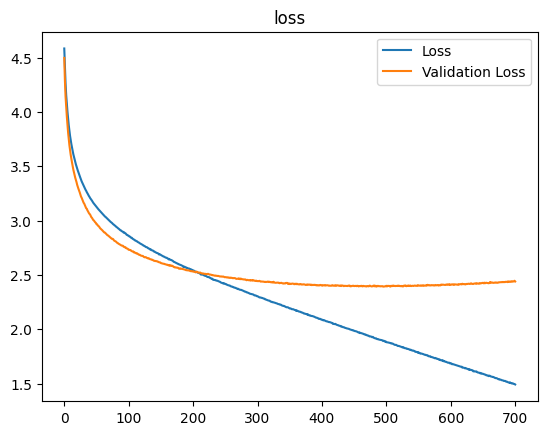

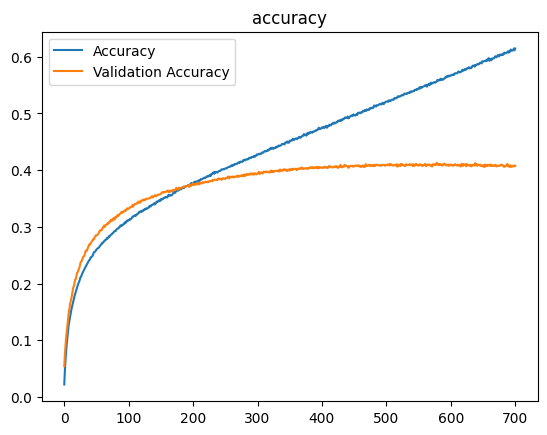

In [51]:
if isinstance(history, pd.DataFrame):
    plt.plot(history['loss'])
    plt.plot(history['val_loss'])
    plt.legend(['train', 'test'])
    plt.title('loss')
    plt.legend(["Loss", "Validation Loss"])
    plt.savefig("loss.png", dpi=300, format="png")
    plt.figure()
    plt.plot(history["accuracy"])
    plt.plot(history['val_accuracy'])
    plt.legend(['train', 'test'])
    plt.title('accuracy')

else:
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.legend(['train', 'test'])
    plt.title('loss')
    plt.legend(["Loss", "Validation Loss"])
    plt.savefig("loss.png", dpi=300, format="png")
    plt.figure()
    plt.plot(history.history["accuracy"])
    plt.plot(history.history['val_accuracy'])
    plt.legend(['train', 'test'])
    plt.title('accuracy')

plt.legend(["Accuracy", "Validation Accuracy"])
plt.savefig("accuracy.png", dpi=300, format="png")


119/119 [==============================] - 14s 109ms/step


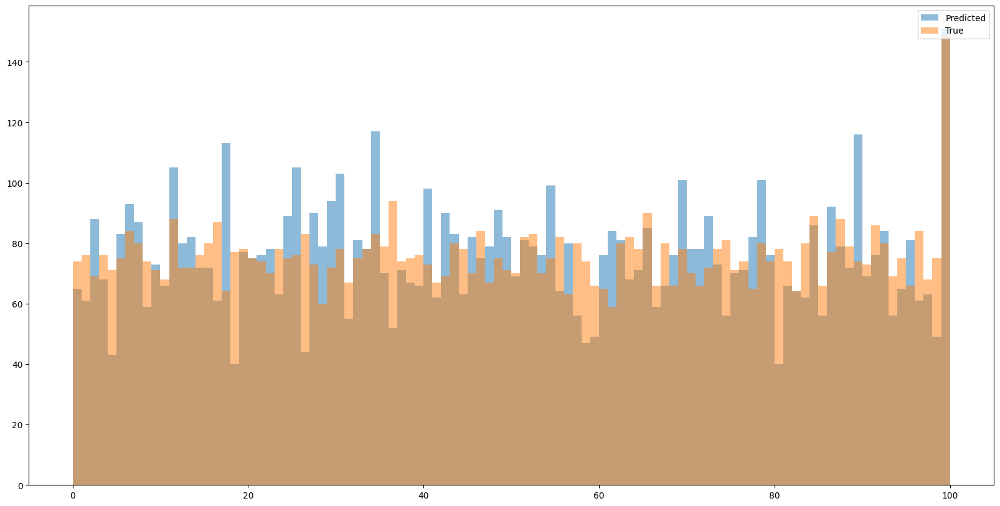

In [30]:
# plot the probability distribution of the predictions
y_pred = vgg16_model.predict(test_data)
y_pred = np.argmax(y_pred, axis=1)
y_true = np.concatenate([y for x, y in test_data], axis=0)

plt.figure(figsize=(20, 10))
plt.hist(y_pred, bins=100, alpha=0.5, label='Predicted')
plt.hist(y_true, bins=100, alpha=0.5, label='True')
plt.legend(loc='upper right')
plt.show()


## Layers output
Here we can see what the network see in each layer, that is, the output.

In [67]:
img_index = 7

In [19]:
def get_plotting_matrix_shape(num):
    """
    Given a number, returns the number of columns and the number of rows needed for a plotting matrix.
    """
    sqrt = int(num ** 0.5)
    if sqrt ** 2 == num:
        return sqrt, sqrt
    else:
        for i in range(sqrt, 0, -1):
            if num % i == 0:
                return num // i, i


In [20]:
def visualize_conv_layer(model, numpy_image, layer_name, numb):
  layer_output=model.get_layer(layer_name).output
  h, w, l = numpy_image.shape[1:]

  intermediate_model=tf.keras.models.Model(
      inputs=model.input,
      outputs=layer_output
  )
  intermediate_prediction=intermediate_model.predict(
      numpy_image[0].reshape(1,h,w,l)
  )

  row_size, col_size = get_plotting_matrix_shape(np.shape(intermediate_prediction)[-1])

  img_index=0
  print(np.shape(intermediate_prediction))

  fig,ax=plt.subplots(row_size,col_size,figsize=(10,8))
  for row in range(0,row_size):
    for col in range(0,col_size):
      ax[row][col].tick_params(left = False, right = False, labelleft = False, labelbottom = False, bottom = False)
      ax[row][col].imshow(intermediate_prediction[0, :, :, img_index], cmap='gray')
      img_index+=1


Text(0.5, 1.0, 'Class: creme_brulee')

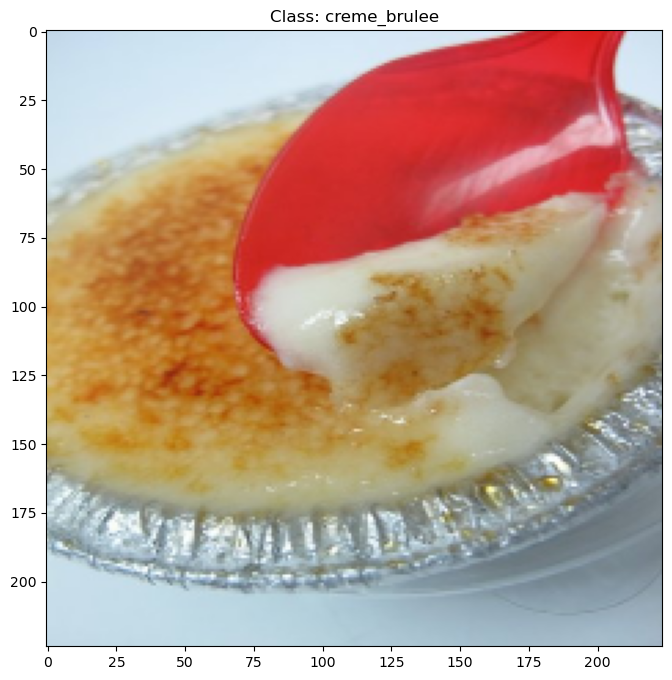

In [68]:
image, label = next(iter(test_data.skip(img_index).take(1)))

fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(image.numpy()[0])
ax.set_title(f'Class: {df_info.features["label"].int2str(label.numpy()[0])}')

1/1 [==============================] - 0s 33ms/step
(1, 112, 112, 64)


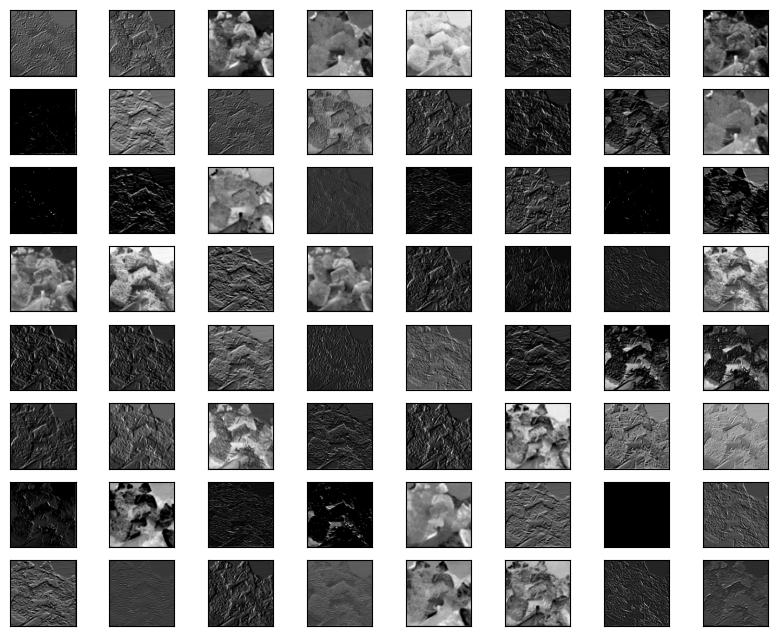

In [35]:
visualize_conv_layer(
    vgg16_model.get_layer('vgg16'),
    image.numpy(),
    'block1_pool',
    img_index
)

1/1 [==============================] - 0s 32ms/step
(1, 56, 56, 128)


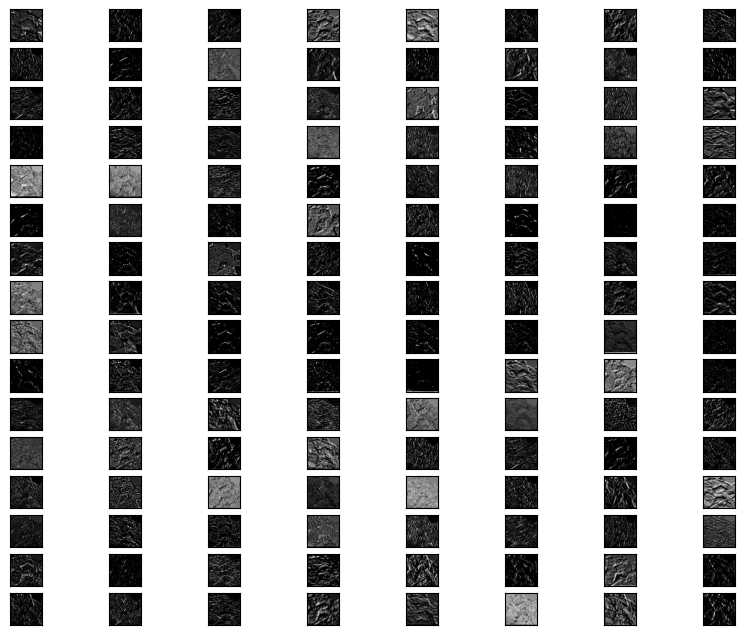

In [36]:
visualize_conv_layer(
    vgg16_model.get_layer('vgg16'),
    image.numpy(),
    'block2_pool',
    img_index
)

1/1 [==============================] - 0s 40ms/step
(1, 28, 28, 256)


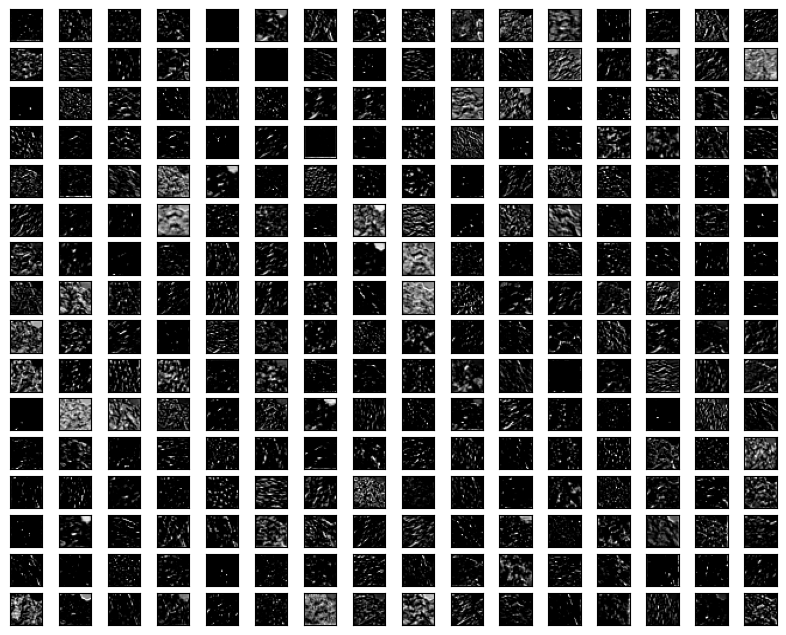

In [37]:
visualize_conv_layer(
    vgg16_model.get_layer('vgg16'),
    image.numpy(),
    'block3_pool',
    img_index
)

1/1 [==============================] - 0s 46ms/step
(1, 14, 14, 512)


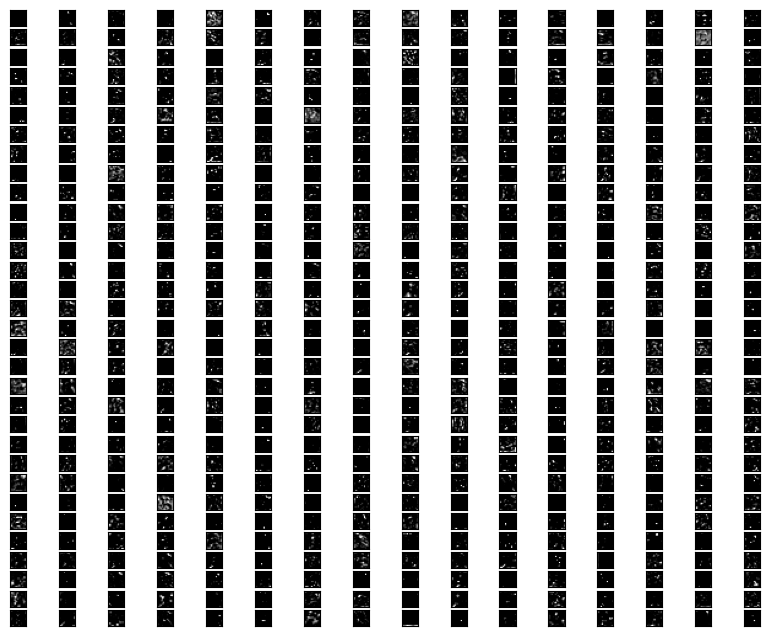

In [38]:
visualize_conv_layer(
    vgg16_model.get_layer('vgg16'),
    image.numpy(),
    'block4_pool',
    img_index
)

1/1 [==============================] - 0s 52ms/step
(1, 7, 7, 512)


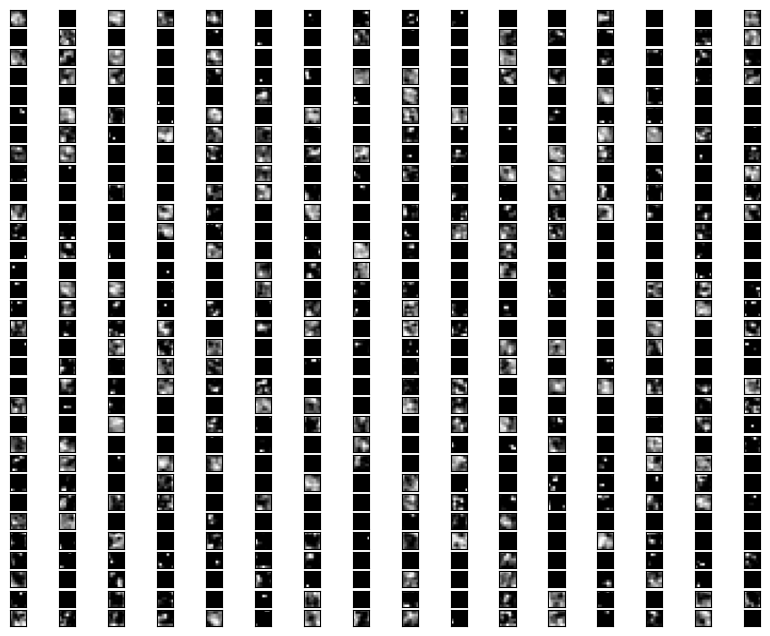

In [39]:
visualize_conv_layer(
    vgg16_model.get_layer('vgg16'),
    image.numpy(),
    'block5_pool',
    img_index
)

# Grad-CAM

In [132]:
import matplotlib.cm as cm
from IPython.display import Image, display


def get_img_array(img_path, size):
    # `img` is a PIL image of size 299x299
    img = tf.keras.utils.load_img(img_path, target_size=size)
    # `array` is a float32 Numpy array of shape (299, 299, 3)
    array = tf.keras.utils.img_to_array(img)
    # We add a dimension to transform our array into a "batch"
    # of size (1, 299, 299, 3)
    array = np.expand_dims(array, axis=0)
    return array


def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = tf.keras.models.Model(
        model.inputs, [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

def save_and_display_gradcam(img_path, heatmap, cam_path="cam.jpg", alpha=0.4):
    # Load the original image
    img = tf.keras.utils.load_img(img_path)
    img = tf.keras.utils.img_to_array(img)

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = tf.keras.utils.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = tf.keras.utils.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = tf.keras.utils.array_to_img(superimposed_img)

    # Save the superimposed image
    superimposed_img.save(cam_path)

    # Display Grad CAM
    display(
        Image(cam_path)
    )

1/1 [==============================] - 0s 326ms/step
Predicted class: 31
Predicted class name: donuts


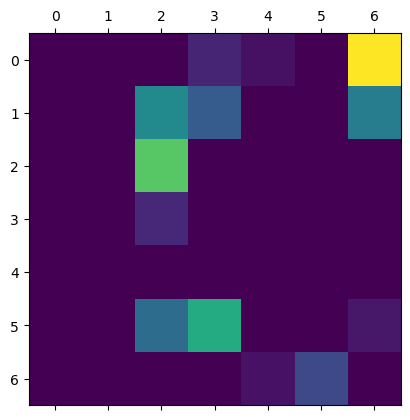

In [133]:
# save img in a temp file
img_path = 'temp.jpg'
tf.keras.utils.save_img(img_path, image.numpy()[0])

# Apply Grad CAM algorithm to the last convolution layer
img_size = (224, 224)
img_array = get_img_array(img_path, size=img_size)

preds = vgg16_model.predict(img_array)
print("Predicted class:", preds.argmax())
print("Predicted class name:", df_info.features["label"].int2str(preds.argmax()))

heatmap = make_gradcam_heatmap(
    img_array, vgg16_model.get_layer('vgg16'), 'block5_pool', pred_index=26
)

plt.matshow(heatmap)
plt.show()

/var/folders/gc/9g_d185n5f9_7rg9rjzlhz9c0000gn/T/ipykernel_965/2379158840.py:56: RuntimeWarning: invalid value encountered in cast
  heatmap = np.uint8(255 * heatmap)


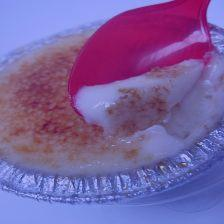

In [108]:
save_and_display_gradcam(img_path, heatmap)

## LIME

Using LIME trying to understand what the model is looking for.

In [40]:
def decode_predictions(preds, top=5, class_index=None):
    """Decodes the prediction of an ImageNet model.

    Args:
      preds: Numpy array encoding a batch of predictions.
      top: Integer, how many top-guesses to return. Defaults to 5.
      class_index: Optional dictionary mapping class index to class label.
        If not provided, will be loaded from a default file.

    Returns:
      A list of lists of top class prediction tuples
      `(class_name, class_description, score)`.
      One list of tuples per sample in batch input.

    Raises:
      ValueError: In case of invalid shape of the `pred` array
        (must be 2D).
    """
    if len(preds.shape) != 2:
        raise ValueError("`preds` must be a 2D array")
    num_classes = preds.shape[1]
    if class_index is None:
        fpath = data_utils.get_file(
            "imagenet_class_index.json",
            "https://storage.googleapis.com/download.tensorflow.org/data/imagenet_class_index.json",
            cache_subdir="models",
            file_hash="c2c37ea517e94d9795004a39431a14cb",
        )
        with open(fpath) as f:
            class_index = json.load(f)
    if len(class_index) != num_classes:
        raise ValueError(
            "number of classes in `class_index` does not match `preds` shape"
        )
    results = []
    for pred in preds:
        top_indices = pred.argsort()[-top:][::-1]
        result = [tuple(class_index[str(i)]) + (pred[i],) for i in top_indices]
        result.sort(key=lambda x: x[1], reverse=True)
        results.append(result)
    return results


In [41]:
preds = vgg16_model.predict(test_data)


119/119 [==============================] - 14s 109ms/step


In [42]:
for x in decode_predictions(preds, class_index=classes_dict)[:10]:
    print(x)


[('huevos_rancheros', 0.2077232), ('hummus', 0.10271246), ('macaroni_and_cheese', 0.09325448), ('breakfast_burrito', 0.09077487), ('risotto', 0.08957099)]
[('carrot_cake', 0.2258807), ('beignets', 0.15018903), ('breakfast_burrito', 0.08723921), ('clam_chowder', 0.052857816), ('huevos_rancheros', 0.04820235)]
[('cannoli', 0.6366869), ('chocolate_cake', 0.15184583), ('bread_pudding', 0.043934204), ('chocolate_mousse', 0.039173502), ('cheesecake', 0.03712774)]
[('chicken_quesadilla', 0.302371), ('apple_pie', 0.06967067), ('hamburger', 0.054132726), ('tiramisu', 0.040542487), ('poutine', 0.03916829)]
[('shrimp_and_grits', 0.30964097), ('escargots', 0.13179305), ('macaroni_and_cheese', 0.12112884), ('pizza', 0.1079834), ('risotto', 0.06932061)]
[('lobster_roll_sandwich', 0.19480926), ('tacos', 0.16695951), ('hot_dog', 0.12251223), ('grilled_cheese_sandwich', 0.10375549), ('breakfast_burrito', 0.087970704)]
[('risotto', 0.9574458), ('macaroni_and_cheese', 0.010538766), ('gnocchi', 0.00938698

In [43]:
explainer = lime_image.LimeImageExplainer(random_state=77)


In [44]:
explanation = explainer.explain_instance(
    image.numpy()[0].astype('double'),
    vgg16_model.predict,
    top_labels=5,
    hide_color=0,
    num_samples=1000
)


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 144ms/step


  1%|          | 10/1000 [00:00<00:17, 56.41it/s]

1/1 [==============================] - 0s 12ms/step


  4%|▎         | 35/1000 [00:00<00:06, 142.42it/s]

1/1 [==============================] - 0s 12ms/step


  6%|▌         | 60/1000 [00:00<00:05, 162.02it/s]

1/1 [==============================] - 0s 12ms/step


  9%|▊         | 87/1000 [00:00<00:04, 197.05it/s]

1/1 [==============================] - 0s 12ms/step


 11%|█         | 110/1000 [00:00<00:04, 188.89it/s]

1/1 [==============================] - 0s 12ms/step


 14%|█▎        | 136/1000 [00:00<00:04, 209.72it/s]

1/1 [==============================] - 0s 12ms/step


 16%|█▌        | 160/1000 [00:00<00:04, 197.92it/s]

1/1 [==============================] - 0s 12ms/step


 19%|█▊        | 187/1000 [00:00<00:03, 217.56it/s]

1/1 [==============================] - 0s 12ms/step


 21%|██        | 210/1000 [00:01<00:03, 201.34it/s]

1/1 [==============================] - 0s 12ms/step


 24%|██▎       | 235/1000 [00:01<00:03, 214.24it/s]

1/1 [==============================] - 0s 12ms/step


 26%|██▌       | 260/1000 [00:01<00:03, 203.90it/s]

1/1 [==============================] - 0s 12ms/step


 29%|██▊       | 287/1000 [00:01<00:03, 221.00it/s]

1/1 [==============================] - 0s 12ms/step


 31%|███       | 310/1000 [00:01<00:03, 202.98it/s]

1/1 [==============================] - 0s 12ms/step


 34%|███▎      | 335/1000 [00:01<00:03, 215.32it/s]

1/1 [==============================] - 0s 12ms/step


 36%|███▌      | 360/1000 [00:01<00:03, 205.27it/s]

1/1 [==============================] - 0s 12ms/step


 39%|███▉      | 388/1000 [00:01<00:02, 224.66it/s]

1/1 [==============================] - 0s 12ms/step


 41%|████      | 412/1000 [00:02<00:02, 207.65it/s]

1/1 [==============================] - 0s 12ms/step


 44%|████▍     | 440/1000 [00:02<00:02, 207.14it/s]

1/1 [==============================] - 0s 12ms/step


 47%|████▋     | 468/1000 [00:02<00:02, 225.06it/s]

1/1 [==============================] - 0s 12ms/step


 49%|████▉     | 492/1000 [00:02<00:02, 208.98it/s]

1/1 [==============================] - 0s 12ms/step


 52%|█████▏    | 519/1000 [00:02<00:02, 224.12it/s]

1/1 [==============================] - 0s 12ms/step


 54%|█████▍    | 543/1000 [00:02<00:02, 209.61it/s]

1/1 [==============================] - 0s 12ms/step


 57%|█████▋    | 570/1000 [00:02<00:02, 203.76it/s]

1/1 [==============================] - 0s 12ms/step


 60%|█████▉    | 596/1000 [00:02<00:01, 217.63it/s]

1/1 [==============================] - 0s 12ms/step


 62%|██████▏   | 620/1000 [00:03<00:01, 204.56it/s]

1/1 [==============================] - 0s 12ms/step


 64%|██████▍   | 645/1000 [00:03<00:01, 216.15it/s]

1/1 [==============================] - 0s 12ms/step


 67%|██████▋   | 670/1000 [00:03<00:01, 204.88it/s]

1/1 [==============================] - 0s 12ms/step


 70%|██████▉   | 699/1000 [00:03<00:01, 226.35it/s]

1/1 [==============================] - 0s 12ms/step


 72%|███████▏  | 723/1000 [00:03<00:01, 211.74it/s]

1/1 [==============================] - 0s 12ms/step


 75%|███████▌  | 750/1000 [00:03<00:01, 205.86it/s]

1/1 [==============================] - 0s 12ms/step


 78%|███████▊  | 778/1000 [00:03<00:00, 224.05it/s]

1/1 [==============================] - 0s 12ms/step


 80%|████████  | 802/1000 [00:03<00:00, 208.89it/s]

1/1 [==============================] - 0s 12ms/step


 83%|████████▎ | 830/1000 [00:04<00:00, 207.97it/s]

1/1 [==============================] - 0s 13ms/step


 85%|████████▌ | 853/1000 [00:04<00:00, 213.35it/s]

1/1 [==============================] - 0s 12ms/step


 88%|████████▊ | 878/1000 [00:04<00:00, 222.95it/s]

1/1 [==============================] - 0s 12ms/step


 90%|█████████ | 901/1000 [00:04<00:00, 205.16it/s]

1/1 [==============================] - 0s 12ms/step


 93%|█████████▎| 928/1000 [00:04<00:00, 221.65it/s]

1/1 [==============================] - 0s 12ms/step


 95%|█████████▌| 951/1000 [00:04<00:00, 202.80it/s]

1/1 [==============================] - 0s 12ms/step


 98%|█████████▊| 977/1000 [00:04<00:00, 217.37it/s]

1/1 [==============================] - 0s 12ms/step


100%|██████████| 1000/1000 [00:04<00:00, 206.75it/s]


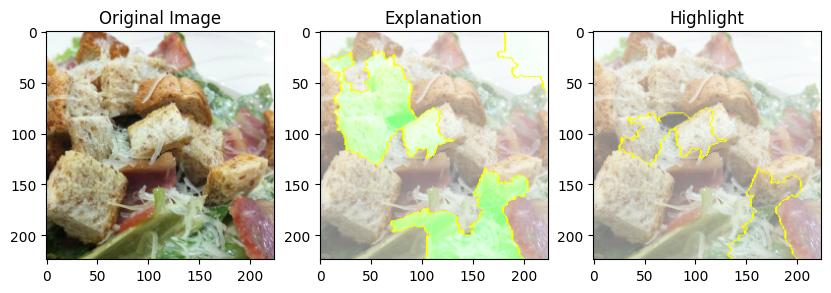

In [45]:
original_image = image.numpy()[0]

temp1, mask1 = explanation.get_image_and_mask(
    explanation.top_labels[0],
    positive_only=False,
    num_features=10,
    hide_rest=False
)

temp2, mask2 = explanation.get_image_and_mask(
    explanation.top_labels[0],
    positive_only=True,
    num_features=5,
    hide_rest=False
)

fig, ax = plt.subplots(1, 3, figsize=(10, 10))
ax[0].imshow(original_image)
ax[0].set_title('Original Image')
ax[1].imshow(mark_boundaries(temp1 / 2 + 0.5, mask1))
ax[1].set_title('Explanation')
ax[2].imshow(mark_boundaries(temp2 / 2 + 0.5, mask2))
ax[2].set_title('Highlight')
plt.show()

In [46]:
np.argmax(vgg16_model.predict(test_data.skip(img_index).take(1)), axis=1)

1/1 [==============================] - 1s 1s/step


array([50, 76,  6, 26, 22, 36, 11, 56,  3, 13, 52,  9, 27,  2, 97, 90, 25,
       15, 29, 87, 39, 48, 56,  6,  9, 71, 48,  4, 61, 75, 27, 69, 78, 29,
        8, 75, 64, 20, 81, 63, 12, 15, 39, 25, 78, 71, 43, 30, 30, 85, 10,
       74, 75, 28, 14, 70, 92, 70, 46, 15, 50, 19, 44, 89])

In [47]:
print('Right class: ', classes_dict[str(label.numpy()[0])])
print('Predicted class: ', classes_dict[str(np.argmax(vgg16_model.predict(image), axis=1)[0])])

Right class:  ['caesar_salad']
2/2 [==============================] - 0s 6ms/step
Predicted class:  ['caesar_salad']


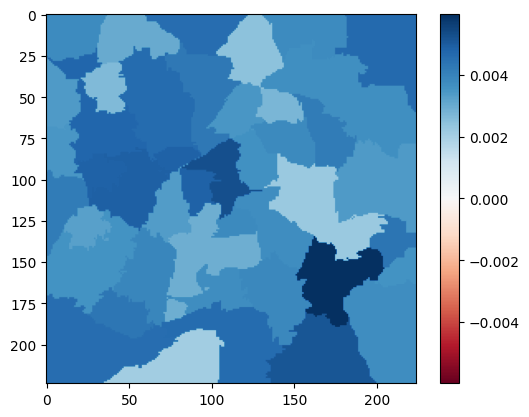

In [48]:
# Select the same class explained on the figures above.
ind = explanation.top_labels[0]

# Map each explanation weight to the corresponding superpixel
dict_heatmap = dict(explanation.local_exp[ind])
heatmap = np.vectorize(dict_heatmap.get)(explanation.segments)

# Plot. The visualization makes more sense if a symmetrical colorbar is used.
plt.imshow(heatmap, cmap='RdBu', vmin=-heatmap.max(), vmax=heatmap.max())
plt.colorbar()
